In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/cassava-leaf-disease-classification/sample_submission.csv
/kaggle/input/cassava-leaf-disease-classification/label_num_to_disease_map.json
/kaggle/input/cassava-leaf-disease-classification/train.csv
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train14-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train13-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train04-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train01-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train08-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train00-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train10-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train02-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train15-1327.tf

In [2]:
import h5py
from PIL import Image
import os
import tensorflow as tf
import PIL
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
import keras
from keras import layers
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
from keras.models import Model, load_model
from keras.preprocessing import image
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras.applications.imagenet_utils import preprocess_input
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.utils import plot_model
from keras.initializers import glorot_uniform
import scipy.misc
from matplotlib.pyplot import imshow
%matplotlib inline

import keras.backend as K

In [3]:
base_dir = "/kaggle/input/cassava-leaf-disease-classification"

In [4]:
train_csv_path = os.path.join(base_dir, 'train.csv')

In [5]:
train_df = pd.read_csv(train_csv_path)

In [6]:
len(train_df)

21397

In [7]:
train_df.keys()

Index(['image_id', 'label'], dtype='object')

In [8]:
train_df

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3
...,...,...
21392,999068805.jpg,3
21393,999329392.jpg,3
21394,999474432.jpg,1
21395,999616605.jpg,4


In [9]:
y_one_hot = tf.one_hot(train_df['label'], depth=5)

In [10]:
y_one_hot

<tf.Tensor: shape=(21397, 5), dtype=float32, numpy=
array([[1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0.],
       ...,
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.]], dtype=float32)>

In [11]:
train_df['label_encoded'] = y_one_hot

In [12]:
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(train_df['label'])
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded = onehot_encoder.fit_transform(integer_encoded)

In [13]:
onehot_encoded

array([[1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0.],
       ...,
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.]])

In [14]:
onehot_enccoded_list = onehot_encoded.tolist()

In [15]:
onehot_enccoded_list

[[1.0, 0.0, 0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 1.0, 0.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 1.0, 0.0, 0.0],
 [1.0, 0.0, 0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 0.0, 1.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 1.0, 0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 1.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 0.0, 1.0],
 [1.0, 0.0, 0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 1.0, 0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 1.0, 0.0, 0.0],
 [0.0, 0.0, 1.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 1.0, 0.0, 0.0],
 [0.0, 0.0, 1.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 0.0, 1.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 1.0

In [16]:
train_df['label_encoded'] = onehot_enccoded_list

In [17]:
train_df['label_typecasted'] = train_df['label'].apply(str)

In [18]:
train_df

,image_id,label,label_encoded,label_typecasted
0,1000015157.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
1,1000201771.jpg,3,"[0.0, 0.0, 0.0, 1.0, 0.0]",3
2,100042118.jpg,1,"[0.0, 1.0, 0.0, 0.0, 0.0]",1
3,1000723321.jpg,1,"[0.0, 1.0, 0.0, 0.0, 0.0]",1
4,1000812911.jpg,3,"[0.0, 0.0, 0.0, 1.0, 0.0]",3
...,...,...,...,...
21392,999068805.jpg,3,"[0.0, 0.0, 0.0, 1.0, 0.0]",3
21393,999329392.jpg,3,"[0.0, 0.0, 0.0, 1.0, 0.0]",3
21394,999474432.jpg,1,"[0.0, 1.0, 0.0, 0.0, 0.0]",1
21395,999616605.jpg,4,"[0.0, 0.0, 0.0, 0.0, 1.0]",4


In [19]:
train_df[train_df['label'] == 0]

,image_id,label,label_encoded,label_typecasted
0,1000015157.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
7,1001320321.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
18,1003888281.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
73,1012426959.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
109,1018973237.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
...,...,...,...,...
21336,986888785.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
21337,986965803.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
21338,986999751.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
21339,987080644.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0


In [20]:
images_directory = os.path.join(base_dir, 'train_images')

In [21]:
images_directory

'/kaggle/input/cassava-leaf-disease-classification/train_images'

In [22]:
image_sample = PIL.Image.open('/kaggle/input/cassava-leaf-disease-classification/train_images/1782983052.jpg')

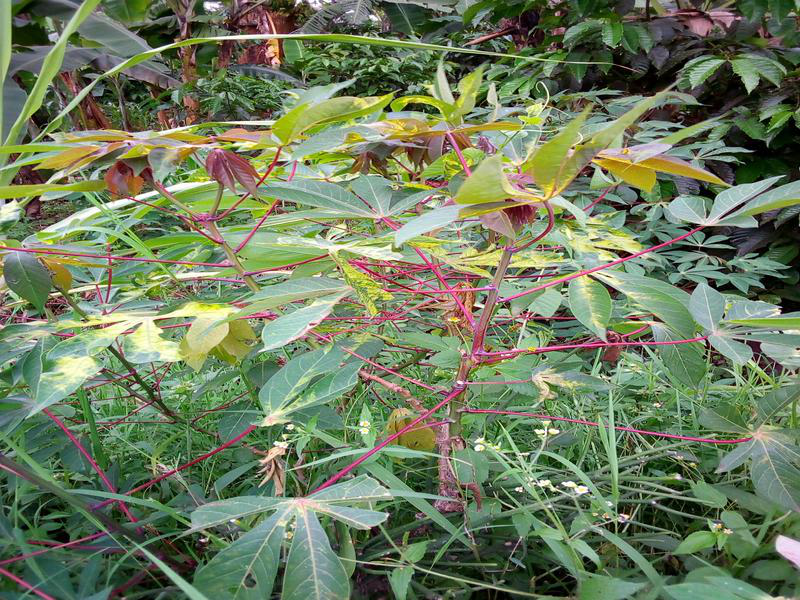

In [23]:
image_sample

In [24]:
image_sample_3_path = os.path.join(images_directory, '1000812911.jpg')

In [25]:
image_sample_3 = PIL.Image.open('/kaggle/input/cassava-leaf-disease-classification/train_images/1782983052.jpg')

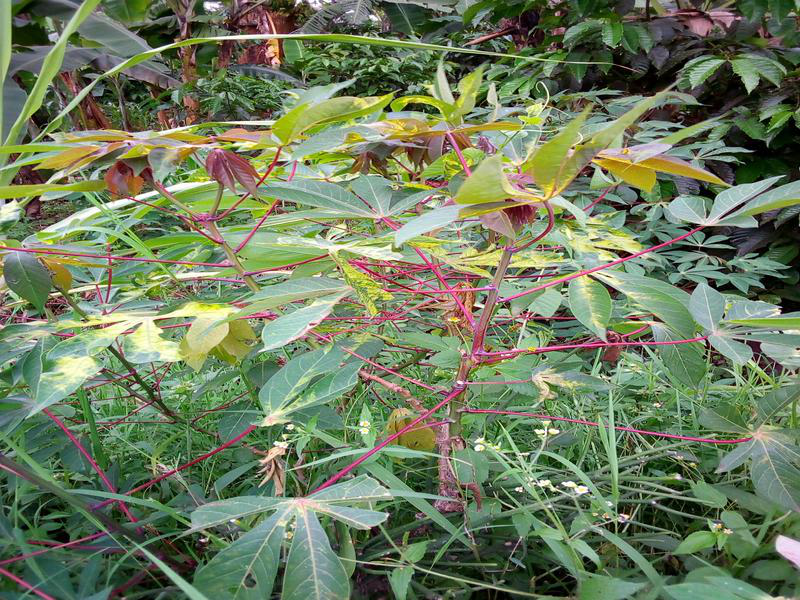

In [26]:
image_sample_3

In [27]:
image_sample_4_path = os.path.join(images_directory, '999998473.jpg')

In [28]:
image_sample_4 = PIL.Image.open(image_sample_4_path)

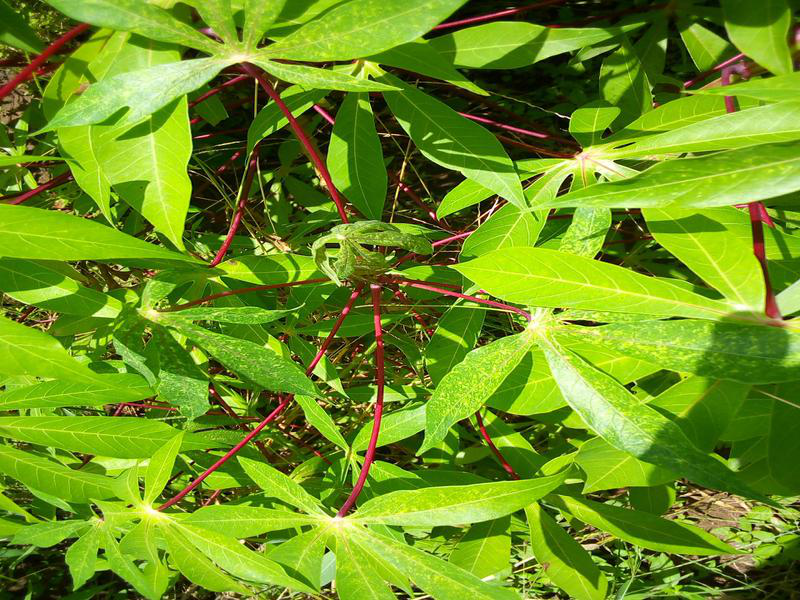

In [29]:
image_sample_4

In [30]:
image_sample_1_directory = os.path.join(images_directory, '999474432.jpg')

In [31]:
image_sample_1 = PIL.Image.open(image_sample_1_directory)

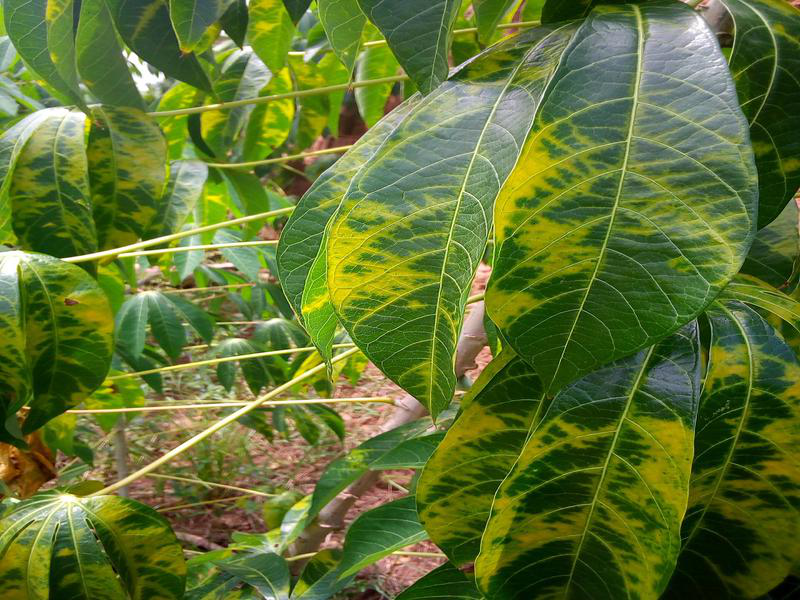

In [32]:
image_sample_1

In [33]:
image_sample_2_directory = os.path.join(images_directory, '996947690.jpg')

In [34]:
image_sample_2 = PIL.Image.open(image_sample_2_directory)

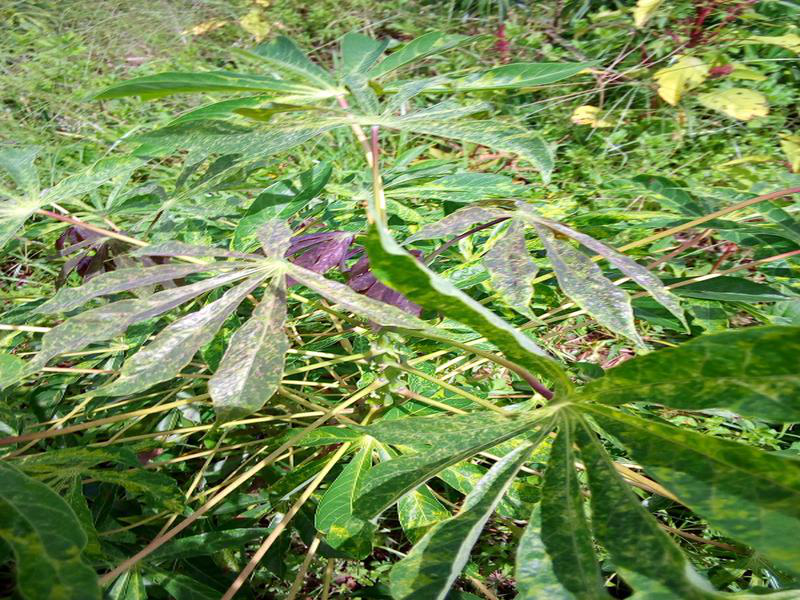

In [35]:
image_sample_2

In [36]:
images_sample_0 = PIL.Image.open(os.path.join(images_directory, '1012426959.jpg'))

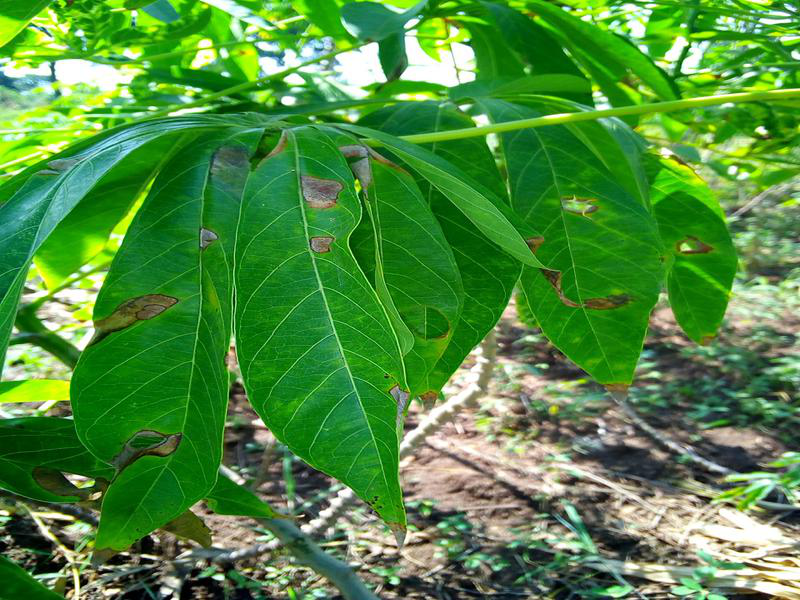

In [37]:
images_sample_0

In [38]:
image_sample.size

(800, 600)

In [39]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=0.01)

In [40]:
train_generator=datagen.flow_from_dataframe(
dataframe=train_df,
directory=images_directory,
x_col="image_id",
y_col="label_typecasted",
subset="training",
batch_size=32,
seed=42,
shuffle=True,
class_mode="categorical",
horizontal_flip = 0.5,
vertical_flip=0.2,
rotation_range=30,
brightness_range=[0.4,1.0],
target_size=(400,300))

Found 21184 validated image filenames belonging to 5 classes.


In [41]:
len(train_generator)

662

In [42]:
def identity_block(X, f, filters, stage, block):
    """
    Implementation of the identity block as defined in Figure 4
    
    Arguments:
    X -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    f -- integer, specifying the shape of the middle CONV's window for the main path
    filters -- python list of integers, defining the number of filters in the CONV layers of the main path
    stage -- integer, used to name the layers, depending on their position in the network
    block -- string/character, used to name the layers, depending on their position in the network
    
    Returns:
    X -- output of the identity block, tensor of shape (n_H, n_W, n_C)
    """
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value. You'll need this later to add back to the main path. 
    X_shortcut = X
    
    # First component of main path
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
        
    # Second component of main path (≈3 lines)
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path (≈2 lines)
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation (≈2 lines)
    X = Add()([X_shortcut, X])
    X = Activation('relu')(X)
    
    
    return X

In [43]:
def convolutional_block(X, f, filters, stage, block, s = 2):
    """
    Implementation of the convolutional block as defined in Figure 4
    
    Arguments:
    X -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    f -- integer, specifying the shape of the middle CONV's window for the main path
    filters -- python list of integers, defining the number of filters in the CONV layers of the main path
    stage -- integer, used to name the layers, depending on their position in the network
    block -- string/character, used to name the layers, depending on their position in the network
    s -- Integer, specifying the stride to be used
    
    Returns:
    X -- output of the convolutional block, tensor of shape (n_H, n_W, n_C)
    """
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value
    X_shortcut = X

    ##### MAIN PATH #####
    # First component of main path 
    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
    # Second component of main path (≈3 lines)
    X = Conv2D(F2, (f, f), strides = (1,1), padding='same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path (≈2 lines)
    X = Conv2D(F3, (1, 1), strides = (1,1), padding='valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    ##### SHORTCUT PATH #### (≈2 lines)
    X_shortcut = Conv2D(F3, (1, 1), strides = (s,s), padding='valid', name = conv_name_base + '1', kernel_initializer = glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation (≈2 lines)
    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)
        
    return X

In [44]:
def ResNet50(input_shape = (64, 64, 3), classes = 6):
    """
    Implementation of the popular ResNet50 the following architecture:
    CONV2D -> BATCHNORM -> RELU -> MAXPOOL -> CONVBLOCK -> IDBLOCK*2 -> CONVBLOCK -> IDBLOCK*3
    -> CONVBLOCK -> IDBLOCK*5 -> CONVBLOCK -> IDBLOCK*2 -> AVGPOOL -> TOPLAYER

    Arguments:
    input_shape -- shape of the images of the dataset
    classes -- integer, number of classes

    Returns:
    model -- a Model() instance in Keras
    """
    
    # Define the input as a tensor with shape input_shape
    X_input = Input(input_shape)

    
    # Zero-Padding
    X = ZeroPadding2D((3, 3))(X_input)
    
    # Stage 1
    X = Conv2D(64, (7, 7), strides = (2, 2), name = 'conv1', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    # Stage 2
    X = convolutional_block(X, f = 3, filters = [64, 64, 256], stage = 2, block='a', s = 1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')

    # Stage 3 (≈4 lines)
    X = convolutional_block(X, f = 3, filters = [128, 128, 512], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    # Stage 4 (≈6 lines)
    X = convolutional_block(X, f = 3, filters = [256, 256, 1024], stage = 4, block='a', s = 2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')

    # Stage 5 (≈3 lines)
    X = convolutional_block(X, f = 3, filters = [512, 512, 2048], stage = 5, block='a', s = 2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')

    # AVGPOOL (≈1 line). Use "X = AveragePooling2D(...)(X)"
    X = AveragePooling2D(pool_size=(2, 2), strides=None, padding="valid", name="avg_pool")(X)
    
    # output layer
    X = Flatten()(X)
    X = Dense(classes, activation='softmax', name='fc' + str(classes), kernel_initializer = glorot_uniform(seed=0))(X)
    
    
    # Create model
    model = Model(inputs = X_input, outputs = X, name='ResNet50')

    return model

In [45]:
model = ResNet50(input_shape = (400, 300, 3), classes=5)

In [46]:
# opt = keras.optimizers.Adam()
# model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [47]:
# class_weight = {0: 1.0,
#                 1: 1.0,
#                 2: 1.0,
#                 3: 0.25,
#                 4: 1.15}

In [48]:
# model.fit(train_generator, epochs=2, class_weight=class_weight)
model.fit(train_generator, epochs=8)

Epoch 1/8
662/662 [==============================] - 395s 584ms/step - loss: 4.2569 - accuracy: 0.5602
Epoch 2/8
662/662 [==============================] - 318s 479ms/step - loss: 1.0257 - accuracy: 0.6299
Epoch 3/8
662/662 [==============================] - 319s 482ms/step - loss: 0.9126 - accuracy: 0.6565
Epoch 4/8
662/662 [==============================] - 320s 483ms/step - loss: 0.8435 - accuracy: 0.6749
Epoch 5/8
662/662 [==============================] - 321s 484ms/step - loss: 0.7943 - accuracy: 0.7002
Epoch 6/8
662/662 [==============================] - 322s 486ms/step - loss: 0.7548 - accuracy: 0.7167
Epoch 7/8
662/662 [==============================] - 321s 485ms/step - loss: 0.7272 - accuracy: 0.7257
Epoch 8/8
662/662 [==============================] - 322s 486ms/step - loss: 0.7020 - accuracy: 0.7304


In [49]:
val_generator=datagen.flow_from_dataframe(
dataframe=train_df,
directory=images_directory,
x_col="image_id",
y_col="label_typecasted",
subset="validation",
batch_size=32,
seed=42,
shuffle=False,
class_mode="categorical",
target_size=(400,300))

Found 213 validated image filenames belonging to 5 classes.


In [50]:
len(val_generator)

7

In [51]:
preds=model.evaluate(val_generator)

7/7 [==============================] - 5s 543ms/step - loss: 1.1428 - accuracy: 0.5493


In [52]:
from kaggle_datasets import KaggleDatasets
import re

In [53]:
GCS_PATH = KaggleDatasets().get_gcs_path()

In [54]:
def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

In [55]:
def get_test_dataset(ordered=False):
    dataset = load_dataset(TEST_FILENAMES, labeled=False, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

In [56]:
def load_dataset(filenames, labeled=True, ordered=False):
    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False # disable order, increase speed
    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTOTUNE) # automatically interleaves reads from multiple files
    dataset = dataset.with_options(ignore_order) # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(partial(read_tfrecord, labeled=labeled), num_parallel_calls=AUTOTUNE)
    return dataset

In [57]:
TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/test_tfrecords/ld_test*.tfrec')
testing_dataset = get_test_dataset()
testing_dataset = testing_dataset.unbatch().batch(20)
NUM_TEST_IMAGES = count_data_items(TEST_FILENAMES)

NameError: name 'AUTOTUNE' is not defined

In [58]:
test_ds = get_test_dataset(ordered=True) 
test_ds = test_ds.map(to_float32)

print('Computing predictions...')
test_images_ds = testing_dataset
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

NameError: name 'AUTOTUNE' is not defined

<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [59]:
print('Generating submission.csv file...')
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch
np.savetxt('submission.csv', np.rec.fromarrays([test_ids, predictions]), fmt=['%s', '%d'], delimiter=',', header='id,label', comments='')
!head submission.csv

Generating submission.csv file...


NameError: name 'test_ds' is not defined